Calculate the Bayes Factor for the absolute magnitude using the `pocoMC` package to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

# import pocomc as pc
import corner

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
data_filename = '../../../../Data/NSA/NSA_v1_0_1_VAGC_vflag-V2-VF_updated.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
rabsmag_NSA = np.array(catalog_main['ELPETRO_ABSMAG'][:,4])

## Separate galaxies by their LSS classifications

### $V^2$

In [6]:
wall_v2 = catalog_main['vflag_V2'] == 0
void_v2 = catalog_main['vflag_V2'] == 1
edge_v2 = catalog_main['vflag_V2'] == 2
out_v2 = catalog_main['vflag_V2'] == 9

### VoidFinder

In [7]:
wall_vf = catalog_main['vflag_VF'] == 0
void_vf = catalog_main['vflag_VF'] == 1
edge_vf = catalog_main['vflag_VF'] == 2
out_vf = catalog_main['vflag_VF'] == 9

In [8]:
del catalog_main, catalog_north, data

# Fit the $M_r$ distributions with skewnormal distributions

Both one- and two-parent models

In [9]:
#rabsmag_bins = np.linspace(-25, -12.5, 170)
rabsmag_bins = np.arange(-24, -15, 0.1)

In [10]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

This is a unimodal distribution, but we are fitting it with a sum of two skew normals to account for the extra bumps in the distributions.

## $V^2$

### 1-parent model

#### Void v. wall

In [11]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-20241108.pickle', 'rb')
V2_results1_samples, lnzM1_V2 = pickle.load(temp_infile)
temp_infile.close()

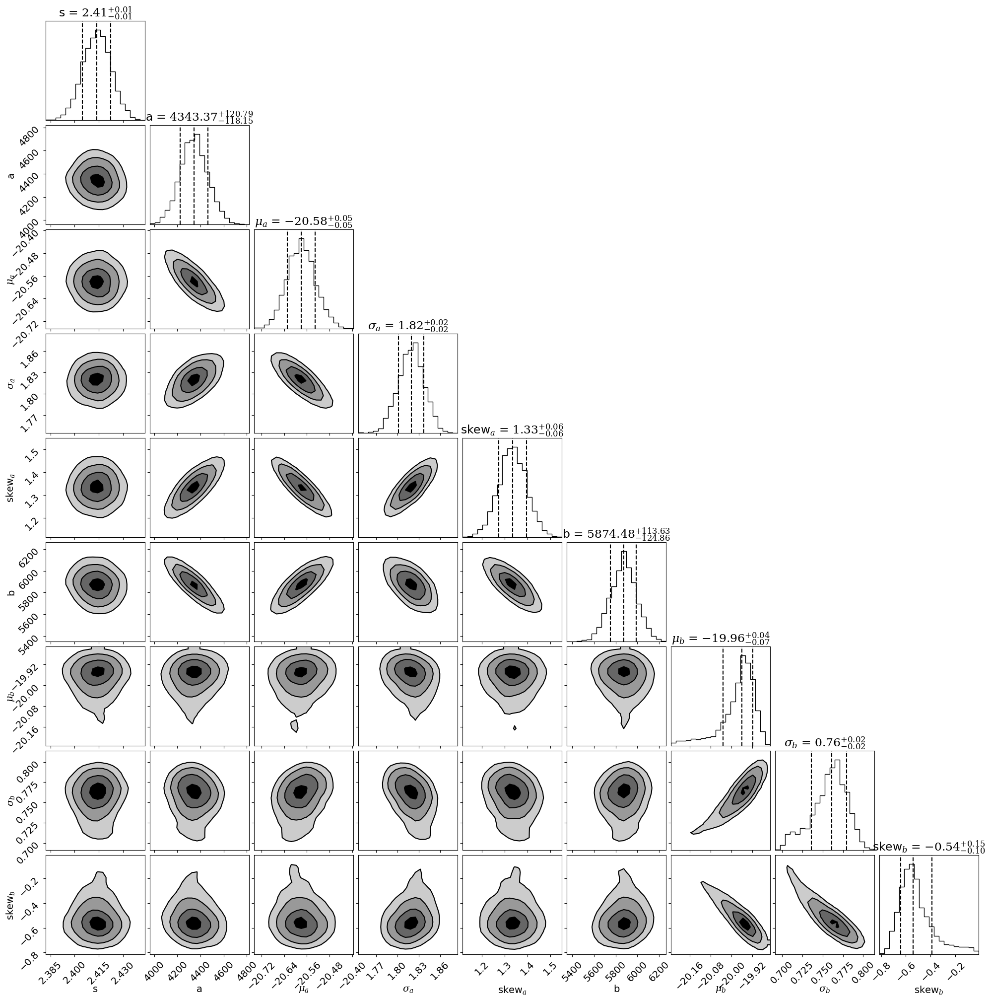

In [12]:
corner.corner(V2_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [13]:
lnzM1_V2

np.float64(-1815.8358684782538)

In [14]:
V2_bestfit1 = np.median(V2_results1_samples, axis=0)
V2_bestfit1

array([ 2.41377859e+00,  4.34336948e+03, -2.05794859e+01,  1.81998422e+00,
        1.33347027e+00,  5.87448039e+03, -1.99596787e+01,  7.60919661e-01,
       -5.42699513e-01])

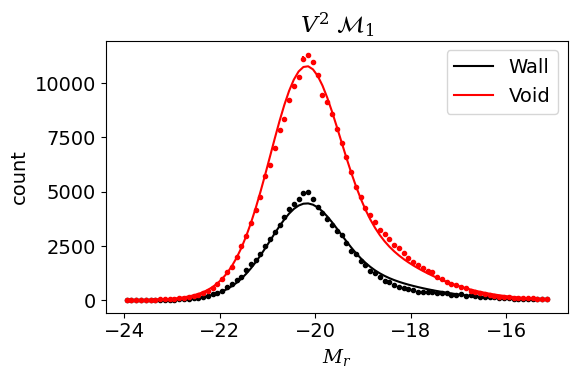

In [15]:
Model_1_plot(V2_bestfit1, 
             rabsmag_NSA[wall_v2], 
             rabsmag_NSA[void_v2], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

#### Wall v. all

In [26]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2wall-20241108.pickle', 'rb')
V2wall_results1_samples, lnzM1_V2wall = pickle.load(temp_infile)
temp_infile.close()

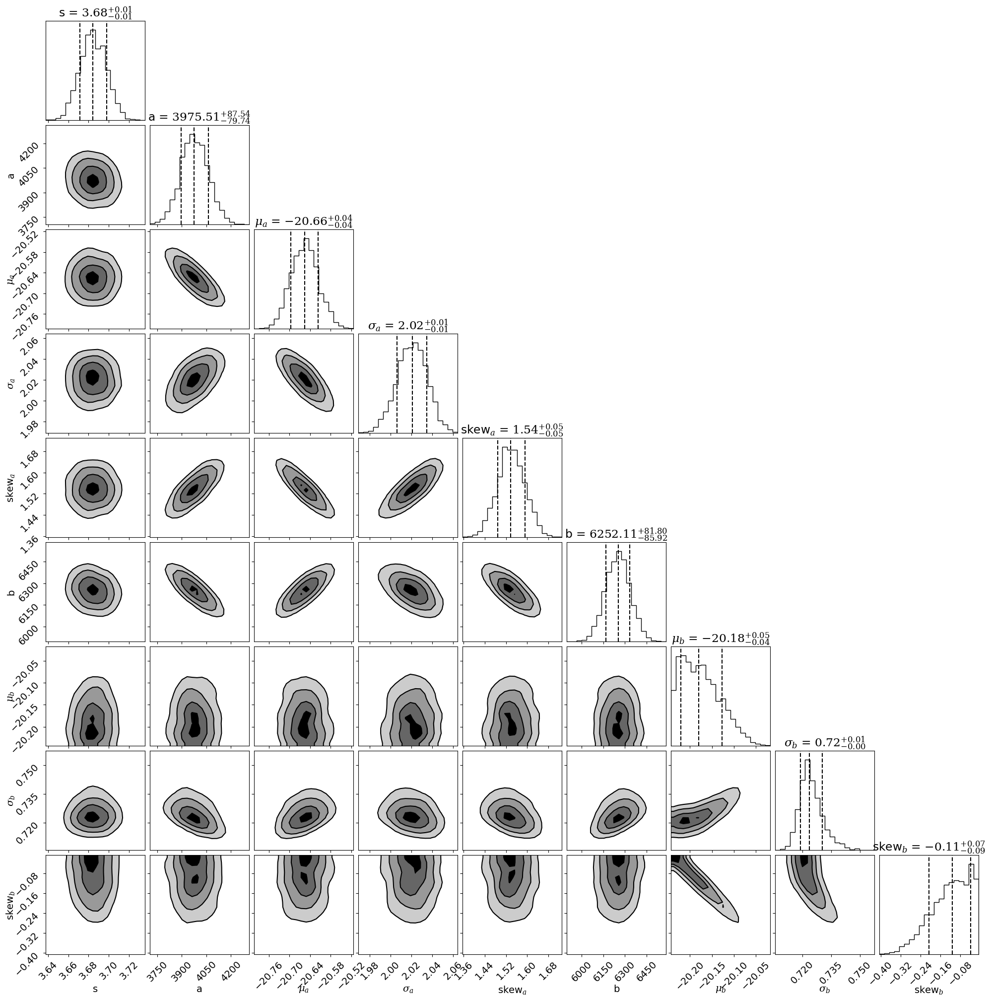

In [27]:
corner.corner(V2wall_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [ ]:
lnzM1_V2wall

In [ ]:
V2wall_bestfit1 = np.median(V2wall_results1_samples, axis=0)

In [ ]:
Model_1_plot(V2wall_bestfit1, 
             rabsmag_NSA[wall_v2], 
             rabsmag_NSA[void_v2 | wall_v2 | edge_v2], 
             rabsmag_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='$M_r$', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

#### Void v. all

In [ ]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2void-20241108.pickle', 'rb')
V2void_results1_samples, lnzM1_V2void = pickle.load(temp_infile)
temp_infile.close()

In [ ]:
corner.corner(V2void_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [ ]:
lnzM1_V2void

In [ ]:
V2void_bestfit1 = np.median(V2void_results1_samples, axis=0)

In [ ]:
Model_1_plot(V2void_bestfit1, 
             rabsmag_NSA[void_v2], 
             rabsmag_NSA[void_v2 | wall_v2 | edge_v2], 
             rabsmag_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='$M_r$', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [16]:
# temp_infile = open('dynesty_output/sampler_results_model2_rabsmag_V2.pickle', 'rb')
# dres2_V2_rabsmag = pickle.load(temp_infile)
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-20241108.pickle', 'rb')
V2_results2_samples, lnzM2_V2 = pickle.load(temp_infile)
temp_infile.close()

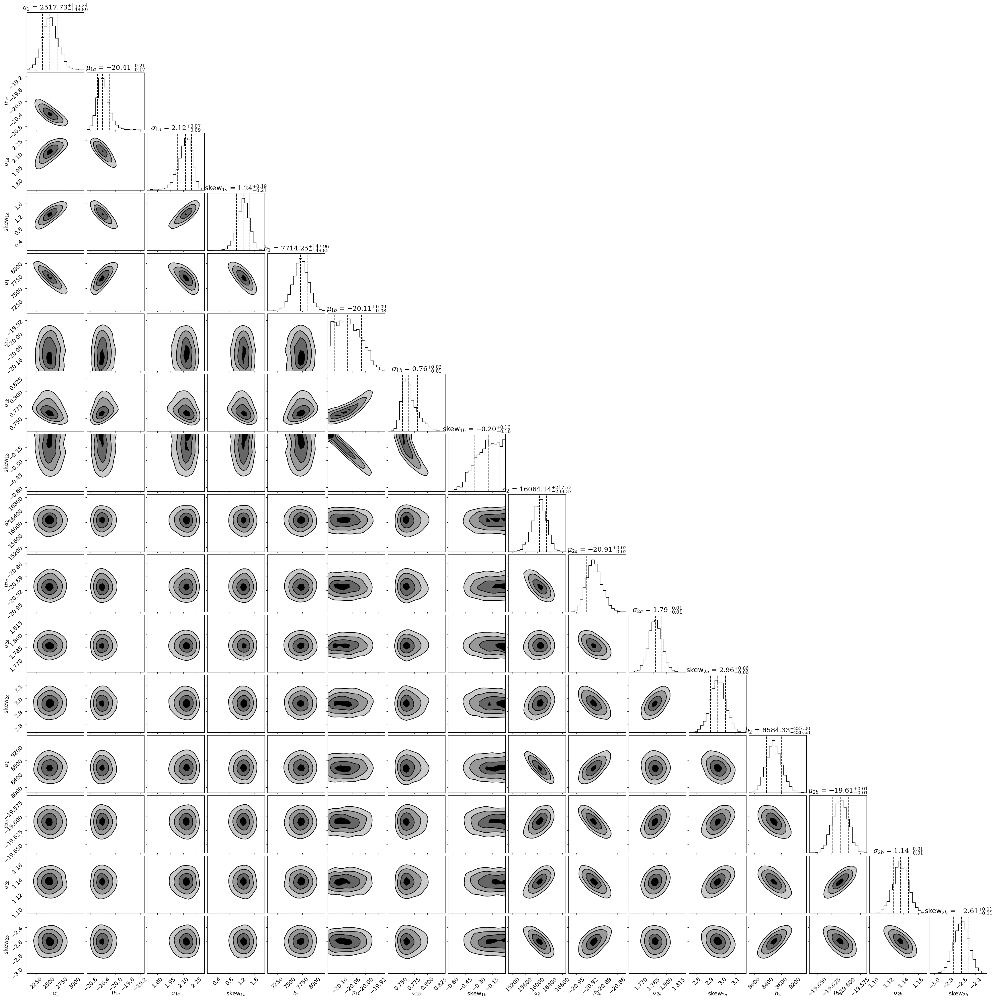

In [17]:
'''
nparams = len(labels2_bi)

fig, axes = dyplot.cornerplot(dres2_V2_rabsmag, smooth=0.03, 
                              labels=labels2_bi, 
                              truths=V2_rabsmag_bestfit2.x, 
                              show_titles=True, 
                              quantiles_2d=[1-np.exp(-0.5*r**2) for r in [1, 2, 3]], 
                              quantiles=[0.16, 0.5, 0.84], 
                              fig=plt.subplots(nparams, nparams, figsize=(2.5*nparams, 2.6*nparams)), 
                              color='#1f77d4')
'''
corner.corner(V2_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

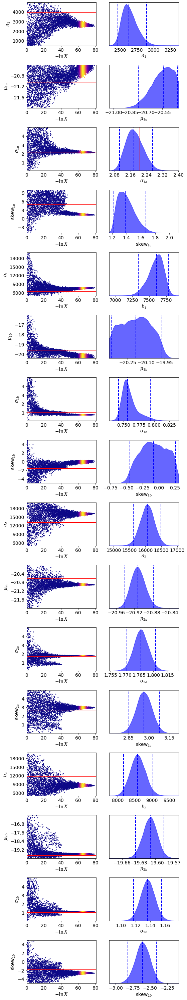

In [77]:
n_params = len(labels2_bi)

fig, axes = dyplot.traceplot(dres2_V2_rabsmag, 
                             labels=labels2_bi, 
                             truths=V2_rabsmag_bestfit2.x, 
                             fig=plt.subplots(n_params, 2, figsize=(8, 2.6*n_params)), 
                             thin=10)

fig.tight_layout();

In [18]:
# lnzM2_V2 = dres2_V2_rabsmag.logz[-1]
lnzM2_V2

np.float64(-1105.3094978092452)

In [19]:
# V2_bestfit2,_ = dyfunc.mean_and_cov(dres2_V2_rabsmag.samples, 
#                                     np.exp(dres2_V2_rabsmag.logwt - lnzM2_V2_rabsmag))
V2_bestfit2 = np.median(V2_results2_samples, axis=0)
V2_bestfit2

array([ 2.51773232e+03, -2.04092967e+01,  2.12312783e+00,  1.23918772e+00,
        7.71424649e+03, -2.01110732e+01,  7.63901207e-01, -1.96644806e-01,
        1.60641359e+04, -2.09115672e+01,  1.78705342e+00,  2.96295860e+00,
        8.58433341e+03, -1.96100793e+01,  1.13628796e+00, -2.60586529e+00])

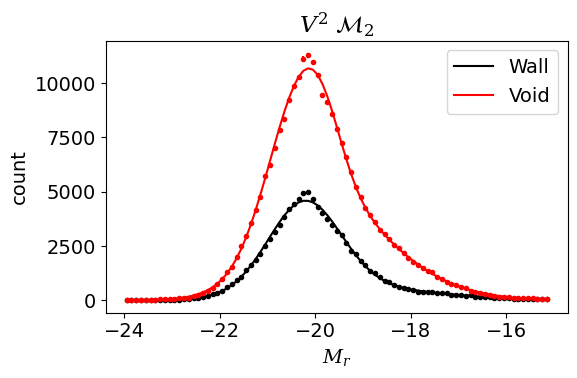

In [20]:
Model_2_plot(V2_bestfit2, 
             rabsmag_NSA[wall_v2], 
             rabsmag_NSA[void_v2], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$ $\mathcal{M}_2$')

#### Wall v. all

In [28]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2wall-20241108.pickle', 'rb')
V2wall_results2_samples, lnzM2_V2wall = pickle.load(temp_infile)
temp_infile.close()

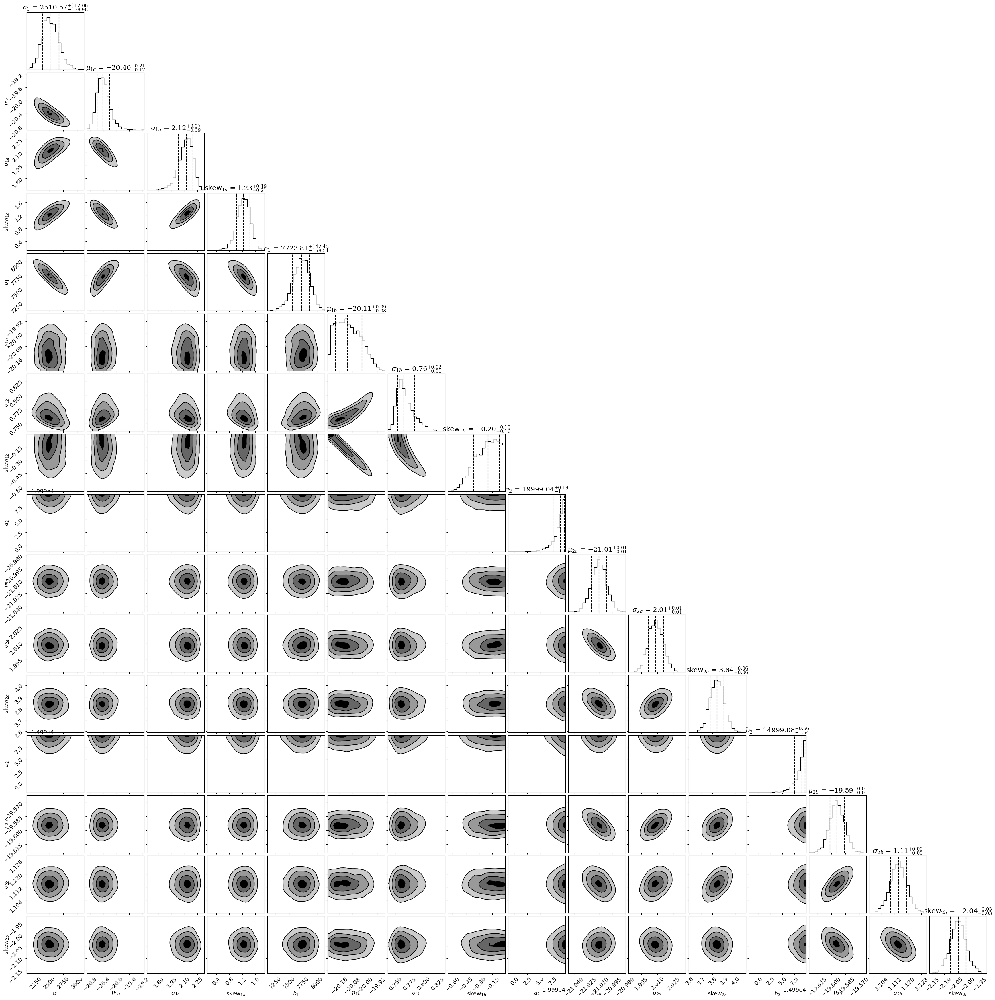

In [29]:
corner.corner(V2wall_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [ ]:
lnzM2_V2wall

In [ ]:
V2wall_bestfit2 = np.median(V2wall_results2_samples, axis=0)

In [ ]:
Model_2_plot(V2wall_bestfit2, 
             rabsmag_NSA[wall_v2], 
             rabsmag_NSA[void_v2 | wall_v2 | edge_v2], 
             rabsmag_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='$M_r$', 
             title_text=r'V$^2$ $\mathcal{M}_2$');

#### Void v. all

In [ ]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2void-20241108.pickle', 'rb')
V2void_results2_samples, lnzM2_V2void = pickle.load(temp_infile)
temp_infile.close()

In [ ]:
corner.corner(V2void_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [ ]:
lnzM2_V2void

In [ ]:
V2void_bestfit2 = np.median(V2void_results2_samples, axis=0)

In [ ]:
Model_2_plot(V2void_bestfit2, 
             rabsmag_NSA[void_v2], 
             rabsmag_NSA[void_v2 | wall_v2 | edge_v2], 
             rabsmag_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='$M_r$', 
             title_text=r'V$^2$ $\mathcal{M}_2$');

### Calculate Bayes factors

#### Void v. wall

In [21]:
lnB12_V2 = lnzM1_V2 - lnzM2_V2

B12_V2 = np.exp(lnB12_V2)

print('V2 (void v. wall) Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2, lnB12_V2*np.log10(np.exp(1))))

V2 (void v. wall) Mr: B12 = 2.64e-309; log(B12) = -308.578


#### Wall v. all

In [ ]:
lnB12_V2wall = lnzM1_V2wall - lnzM2_V2wall

B12_V2wall = np.exp(lnB12_V2wall)

print('V2 (wall v. all) Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2wall, lnB12_V2wall*np.log10(np.exp(1))))

#### Void v. all

In [ ]:
lnB12_V2void = lnzM1_V2void - lnzM2_V2void

B12_V2void = np.exp(lnB12_V2void)

print('V2 (void v. all) Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2void, lnB12_V2void*np.log10(np.exp(1))))

## VoidFinder

### 1-parent model

In [20]:
#temp_infile = open('dynesty_output/sampler_results_model1_gauss_rabsmag_V2.pickle', 'rb')
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_VoidFinder.pickle', 'rb')
VF_results1 = pickle.load(temp_infile)
temp_infile.close()

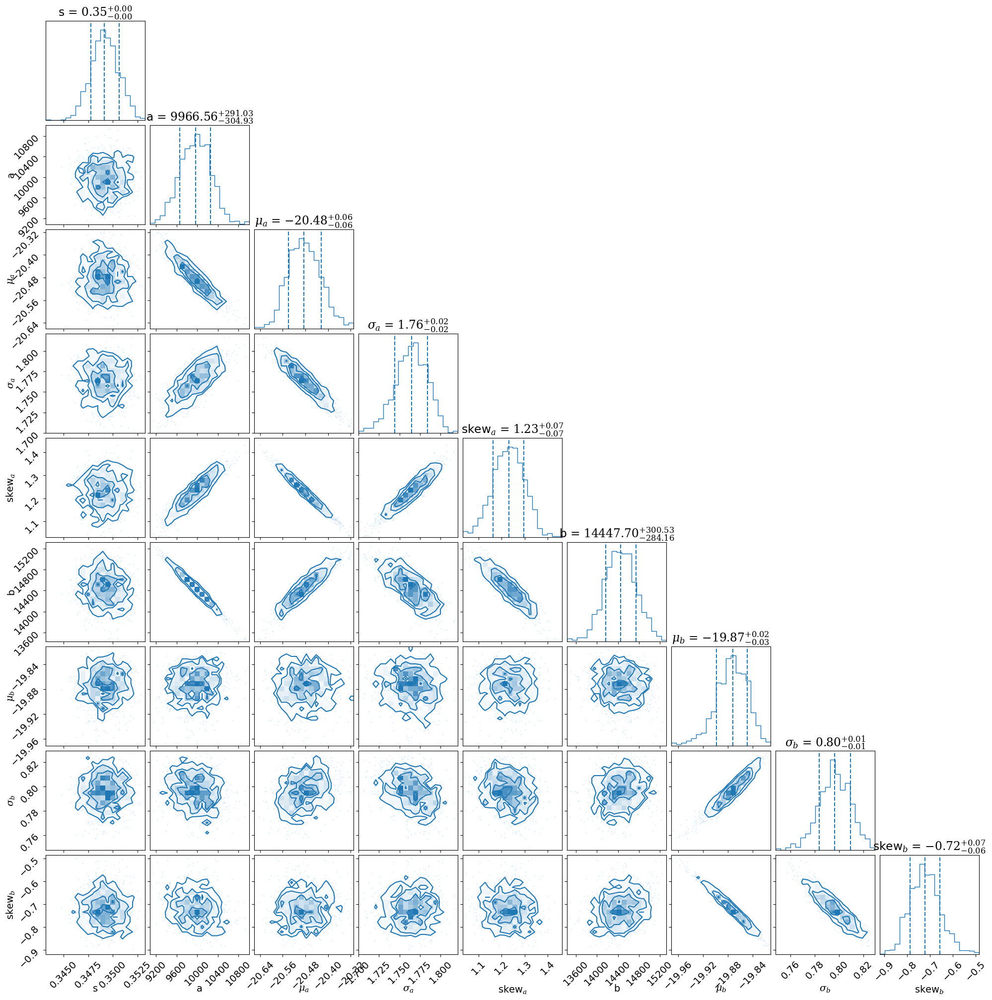

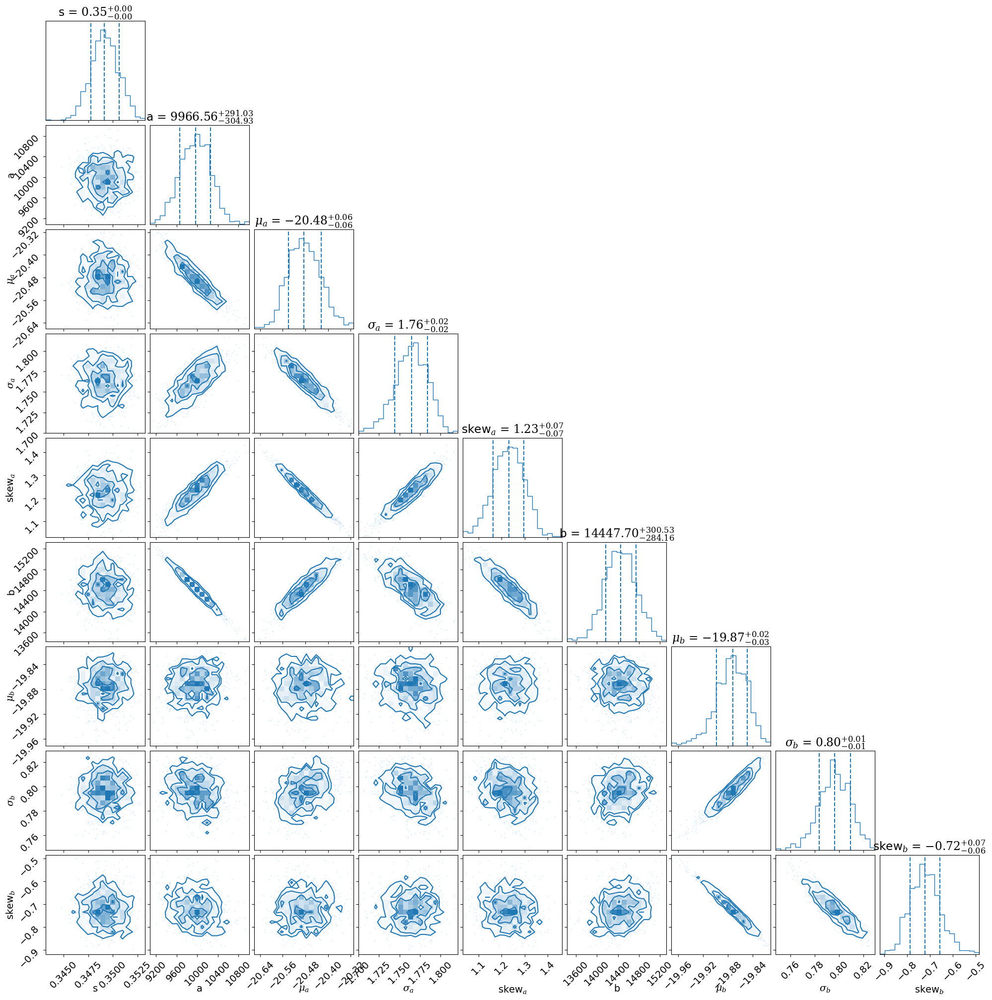

In [21]:
pc.plotting.corner(VF_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [22]:
lnzM1_VF = VF_results1['logz'][-1]
lnzM1_VF

-4018.1668195403076

In [23]:
VF_bestfit1 = np.mean(VF_results1['samples'], axis=0)

VF_bestfit1

array([ 3.4916773e-01,  9.9653994e+03, -2.0482307e+01,  1.7638901e+00,
        1.2290890e+00,  1.4447250e+04, -1.9874393e+01,  7.9624361e-01,
       -7.1981275e-01], dtype=float32)

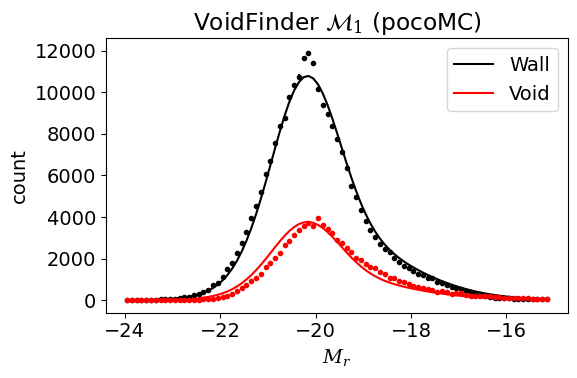

In [24]:
Model_1_plot(VF_bestfit1, 
             rabsmag_NSA[wall_vf], 
             rabsmag_NSA[void_vf], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'VoidFinder $\mathcal{M}_1$ (pocoMC)')

### 2-parent model

In [30]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_VoidFinder.pickle', 
                   'rb')
VF_results2 = pickle.load(temp_infile)
temp_infile.close()

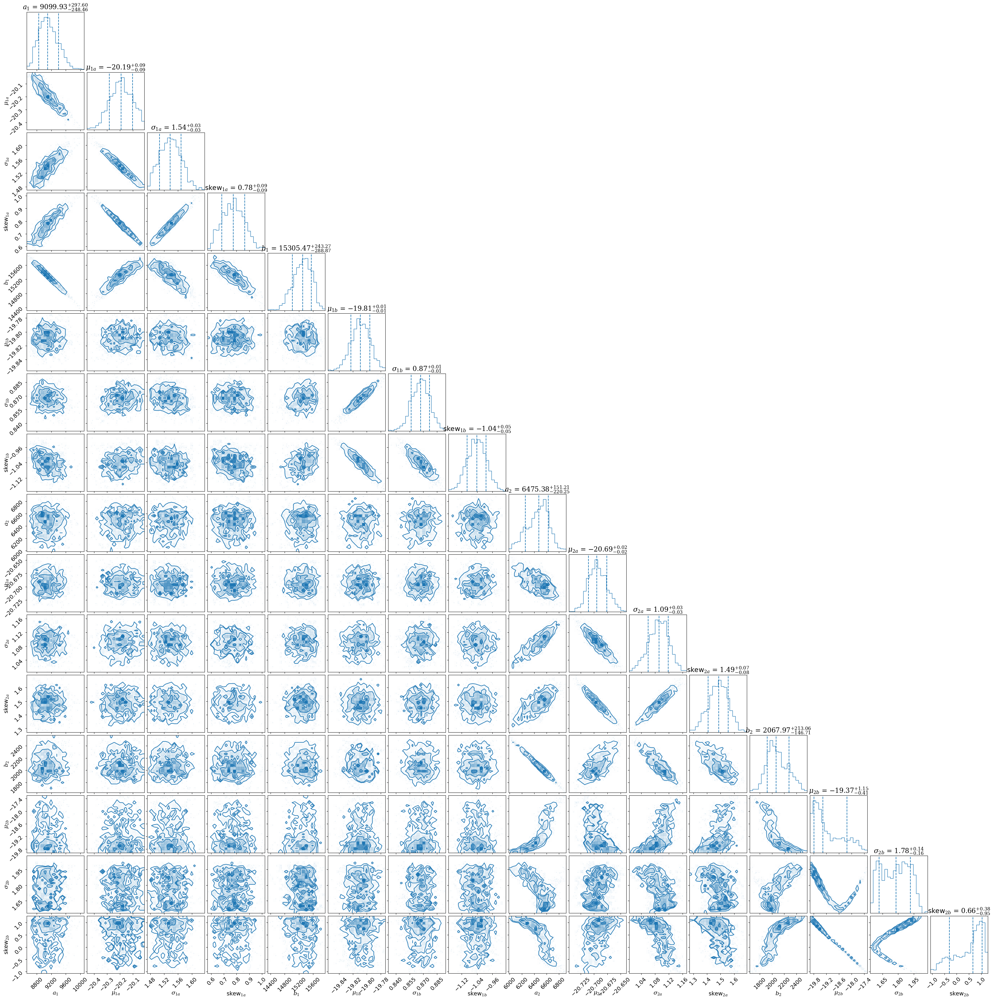

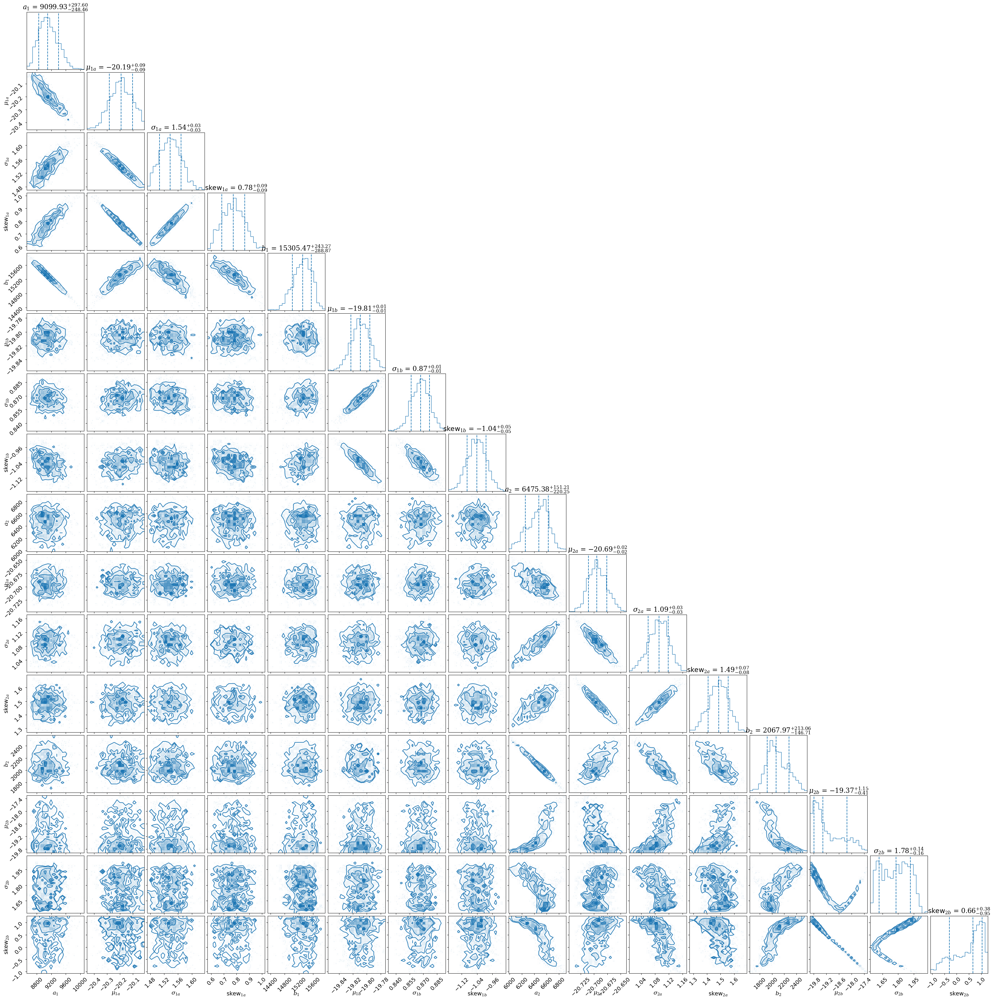

In [31]:
pc.plotting.corner(VF_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [32]:
lnzM2_VF = VF_results2['logz'][-1]
lnzM2_VF

-1144.4396021477944

In [33]:
VF_bestfit2 = np.mean(VF_results2['samples'], axis=0)

VF_bestfit2

array([ 9.1182012e+03, -2.0192127e+01,  1.5382347e+00,  7.7503002e-01,
        1.5285793e+04, -1.9809214e+01,  8.6686379e-01, -1.0421410e+00,
        6.4561812e+03, -2.0693336e+01,  1.0900003e+00,  1.4823964e+00,
        2.0898152e+03, -1.9109688e+01,  1.7732158e+00,  4.5963880e-01],
      dtype=float32)

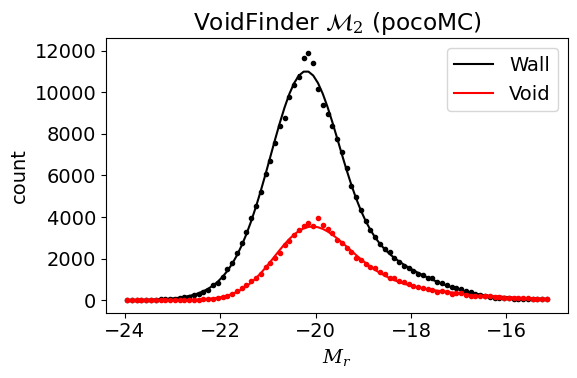

In [34]:
Model_2_plot(VF_bestfit2, 
             rabsmag_NSA[wall_vf], 
             rabsmag_NSA[void_vf], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'VoidFinder $\mathcal{M}_2$ (pocoMC)')

### Calculate Bayes factors

In [36]:
lnB12_VF = lnzM1_VF - lnzM2_VF

B12_VF = np.exp(lnB12_VF)

print('VoidFinder Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_VF, lnB12_VF*np.log10(np.exp(1))))

VoidFinder Mr: B12 = 0; log(B12) = -1248.044


So both $V^2$ and VoidFinder overwhelmingly favor model $\mathcal{M}_2$, in which the two data sets come from different parent distributions.